In [8]:
#### konlpy 설치 (jpype, java_home 환경변수 설정, 시스템파일 수정), wordcloud 설치 과정은 따로 기재하지 않았습니다. #####

import os
import sys
import pandas as pd
import numpy as np
import re
from pykospacing import Spacing

from konlpy.tag import Okt # 형태소분석기 : Openkoreatext
from collections import Counter # 빈도 수 세기
from wordcloud import WordCloud # wordcloud 만들기
from ckonlpy.tag import Twitter
import matplotlib.pyplot as plt # 시각화
import matplotlib as mpl
import seaborn as sns 

from matplotlib import font_manager, rc # font 설정
import nltk
# matplotlib 그래프 한글폰트 깨질 때 대처(Mac & Window)
import platform
font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name() 
rc('font', family=font_name)


In [114]:
csv_file = 'datasets.csv'
df = pd.read_csv(csv_file)
df.head(3)

,title,location,Main_task,qualifications,Preferred_Qualifications,skills,url
0,Google Cloud Platform Solutions Engineer,서울 강남구,• GCP 클라우드 아키텍처 설계 및 기술 컨설팅 수행\n• 고객사 클라우드 마이그...,• 클라우드 환경에서의 프로젝트 경험 보유 (토이 프로젝트 포함)\n• Genera...,• Generative AI 프로젝트 경험자\n• AI/ML 프로젝트 수행 경험 또...,[],https://www.wanted.co.kr/wd/263995
1,코덱SW엔지니어 (화질분석/신입),서울 강남구,"[다음 업무를 통해 목표를 달성하고 성장합니다]\n• 영상처리, 동영상 압축 알고리...","[이런분과 함께하고 싶어요]\n• 전자, 컴퓨터공학 학사 이상\n• C, Pytho...",[이런분이라면 더욱 환영해요]\n• 비디오 압축 혹은 영상 처리 관련 연구 수행 및...,"['Linux', 'Java', 'Python', 'C', 'C++']",https://www.wanted.co.kr/wd/174091
2,코덱SW엔지니어 (알고리즘개발/신입),서울 강남구,"[이런분과 함께하고 싶어요]\n• 영상처리, 동영상 압축 등 멀티미디어 처리 기술개발","[이런분이라면 더욱 환영해요]\n• 전자, 컴퓨터공학 학사 이상\n• C/C++ 능...",[더 몰입하실 수 있도록 도와드려요]\n• 비디오 압축 혹은 영상 처리 관련 연구 ...,"['Linux', 'Java', 'Python', 'C', 'C++']",https://www.wanted.co.kr/wd/174088


In [10]:
# 중복된 행 갯수 확인 후 출력력
print(df.duplicated(subset=[col for col in df.columns if col not in ['url', 'skills']]).sum())
df[df.duplicated(subset=[col for col in df.columns if col not in ['url', 'skills']], keep=False)]


1


,title,location,Main_task,qualifications,Preferred_Qualifications,skills,url
24,AI 엔지니어(NLP/LLM),서울 송파구,"• LLM 모델 커스터마이징을 위한 대규모 데이터 관리(전처리, 후처리)\n• LL...",• 최신 NLP (특히 LLM) 모델을 사용하거나 공부한 경험이 있으신 분\n• N...,• 자연어 처리(NLP) 및 머신러닝(ML) 분야에서의 최소 3-5년 이상의 실무 ...,[],https://www.wanted.co.kr/wd/259565
71,AI 엔지니어(NLP/LLM),서울 송파구,"• LLM 모델 커스터마이징을 위한 대규모 데이터 관리(전처리, 후처리)\n• LL...",• 최신 NLP (특히 LLM) 모델을 사용하거나 공부한 경험이 있으신 분\n• N...,• 자연어 처리(NLP) 및 머신러닝(ML) 분야에서의 최소 3-5년 이상의 실무 ...,[],https://jumpit.saramin.co.kr/position/41679


In [11]:
# 만약 중복된 데이터가 있다면 제거 (첫번째 데이터만 남김)
df = df.drop_duplicates(subset=[col for col in df.columns if col not in ['url', 'skills']], keep='first')
print(df.duplicated(subset=[col for col in df.columns if col not in ['url', 'skills']]).sum())

0


## 지역


In [133]:
location_df = df['location'].value_counts().reset_index()
location_df

,location,count
0,서울 강남구,46
1,서울 강서구,9
2,경기 성남시,8
3,서울 중구,6
4,경기 용인시,6
5,서울 송파구,5
6,서울 영등포구,3
7,서울 관악구,3
8,서울 금천구,3
9,서울 서초구,3


C:\Users\User\AppData\Local\Temp\ipykernel_24488\4290554669.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar = sns.barplot(data=location_df, x='location', y='count', palette=sns.color_palette("husl", n_colors=len(location_df)))


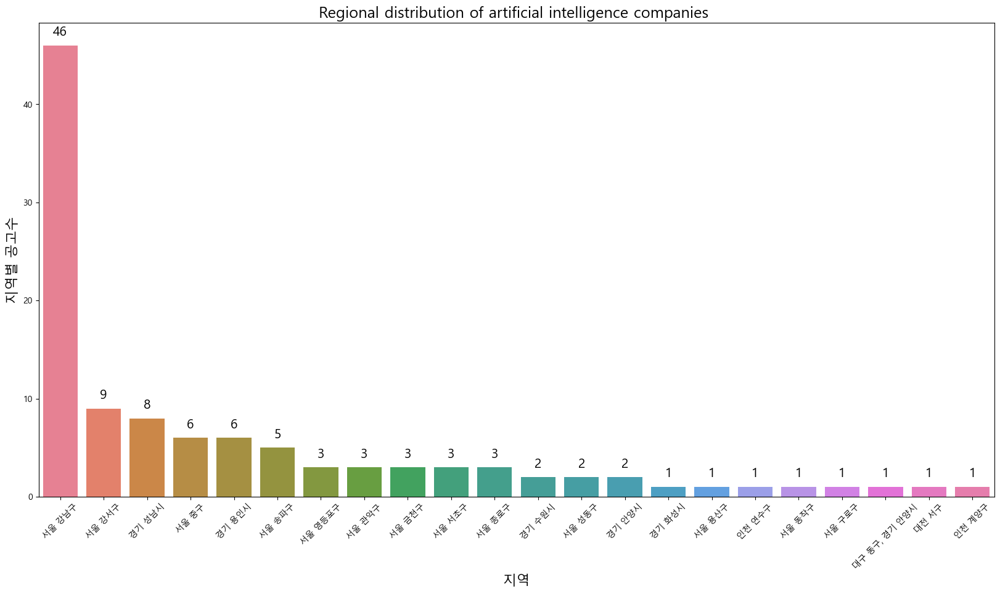

In [134]:

plt.figure(figsize=(20, 10))
bar = sns.barplot(data=location_df, x='location', y='count', palette=sns.color_palette("husl", n_colors=len(location_df)))

bar.set_title('Regional distribution of artificial intelligence companies ', fontsize=18)
bar.set_xlabel('지역', fontdict={'size': 16})                   
bar.set_ylabel('지역별 공고수', fontdict={'size': 16}) 
for p in bar.patches: 
    height = p.get_height()
    bar.text(p.get_x() + p.get_width() / 2., height + 1, int(height), ha='center', size=15)
plt.xticks(rotation=45)
plt.show()


## 주요 업무

In [21]:
nltk.download('punkt') # 토큰화 작업을 위한 리소스 다운로드

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [102]:
token_rank={}
tesxt_tokens_list=[]
for i in df[['Main_task','qualifications','Preferred_Qualifications']]:
    df[i].to_csv(f'{i}.txt', encoding='utf-8-sig')
    text_file = open(f'{i}.txt',encoding='utf-8-sig').read()
    text_file_cleaned = re.sub('[^A-Za-z \s]','',text_file) 
    text_file_cleaned = text_file_cleaned.lower() 
    text_tokens = nltk.tokenize.word_tokenize(text_file_cleaned)
    stop_words = ['ai', 'and', 'in', 'level', 'the', 'to', 'of','eg','or','learning','ex','with']  
    text_tokens = [word for word in text_tokens if not word in stop_words]  
    cleaned_text = Counter(text_tokens)  
    cleaned_text_ranked = dict(cleaned_text.most_common())  
    token_rank[i] = cleaned_text_ranked
    tesxt_tokens_list.append(text_tokens)


<>:6: SyntaxWarning: invalid escape sequence '\s'
<>:6: SyntaxWarning: invalid escape sequence '\s'
C:\Users\User\AppData\Local\Temp\ipykernel_24488\3394329202.py:6: SyntaxWarning: invalid escape sequence '\s'
  text_file_cleaned = re.sub('[^A-Za-z \s]','',text_file)


<>:3: SyntaxWarning: invalid escape sequence '\W'
<>:3: SyntaxWarning: invalid escape sequence '\W'
C:\Users\User\AppData\Local\Temp\ipykernel_24488\483265596.py:3: SyntaxWarning: invalid escape sequence '\W'
  wc = WordCloud(font_path = 'C:\Windows\Fonts\malgun.ttf',background_color="white",width=2000, height=1000).generate_from_frequencies(token_rank[i])


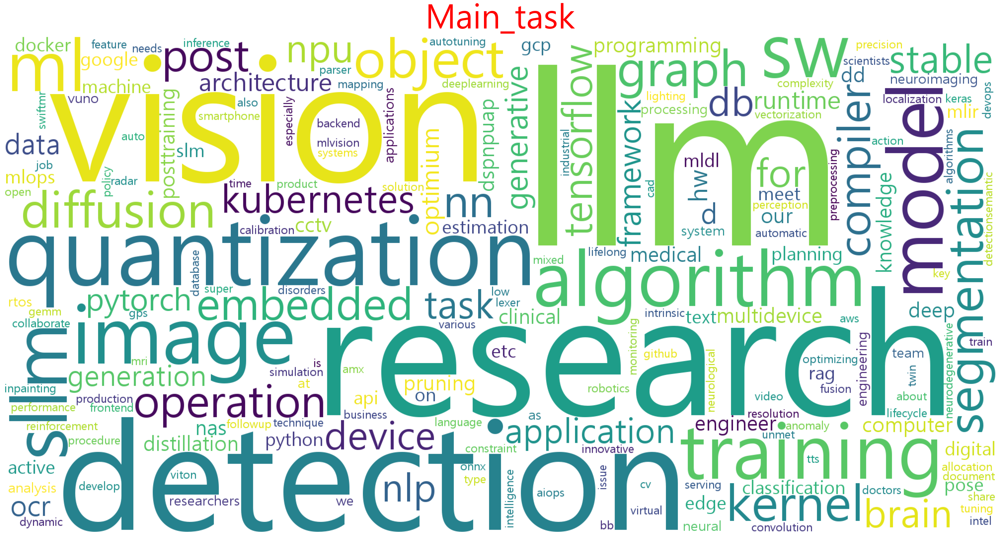

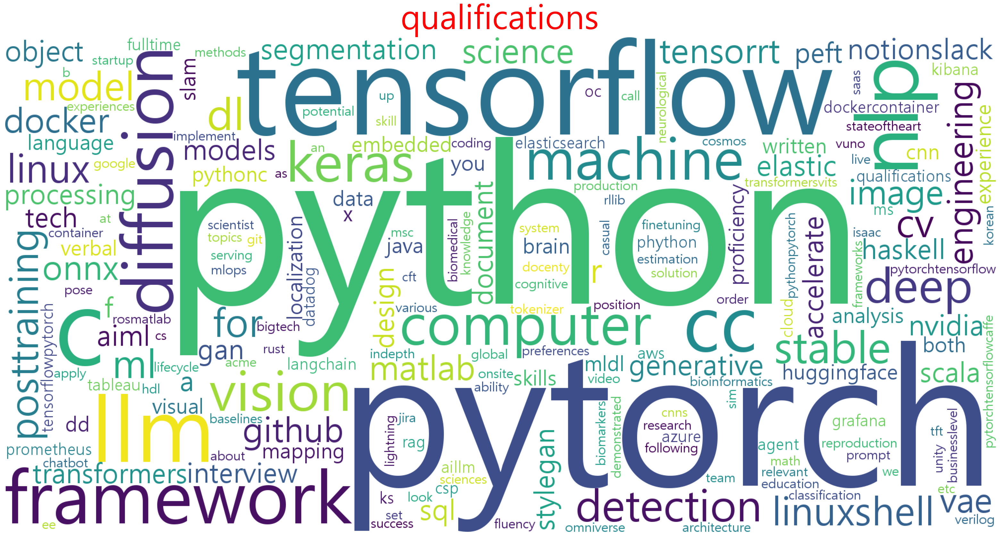

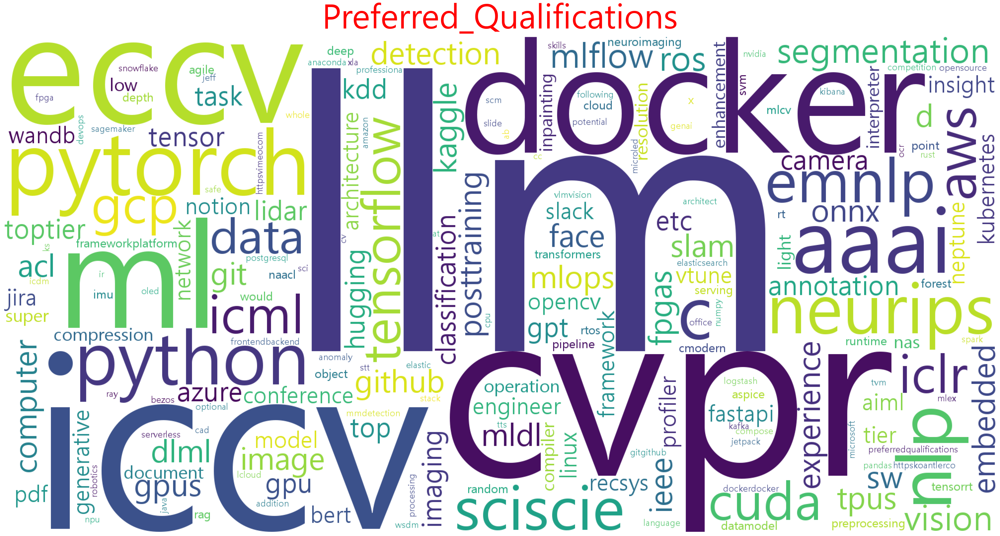

In [138]:
# wordcloud 만들기
for i in token_rank:
    wc = WordCloud(font_path = 'C:\Windows\Fonts\malgun.ttf',background_color="white",width=2000, height=1000).generate_from_frequencies(token_rank[i]) 
    plt.figure(figsize = (40,40))
    plt.imshow(wc)
    plt.axis('off')
    plt.title(i,fontsize=75, color='red')
    plt.show()

In [112]:
def tokenizer_konlpy(text):
    okt=Okt()  
    return [word for word in okt.nouns(text) if len(word)>1] 
n=0
all_token_rank={}
Kr_stop_words = [
    '개발', '연구', '기반', '활용', '분석', '설계', '성능', '처리', '시스템', '서비스', '대한','지식','국제','컴퓨터','포함','작성','데이터','알고리즘',
    '수행', '구현', '개선', '진행', '통한', '관련', '업무', '지원', '문제', '환경', '분야','환경','우대','이상','게재','기본','최신','기술', '이해','요원',
    '과제', '자체', '통해', '유지', '적용', '과정', '문서', '사용', '테스트', '협업', '목표','경험','관련','보유','제품','능력','모델','학습','프로젝트'
    ]

for i in df[['Main_task','qualifications','Preferred_Qualifications']]:
    text_file = open(f'{i}.txt',encoding='utf-8-sig').read()
    noun = tokenizer_konlpy(text_file)
    kor_counted = Counter(noun)
    kor_counted_ranked = kor_counted.most_common(100)
    cleaned_kor = [word for word in noun if not word in Kr_stop_words] #불용어 제거
    cleaned_all = tesxt_tokens_list[n] + cleaned_kor 
    counted_all = Counter(cleaned_all)
    counted_all_ranked = dict(counted_all.most_common())
    all_token_rank[i]=counted_all_ranked
    

<>:3: SyntaxWarning: invalid escape sequence '\W'
<>:3: SyntaxWarning: invalid escape sequence '\W'
C:\Users\User\AppData\Local\Temp\ipykernel_24488\3359298615.py:3: SyntaxWarning: invalid escape sequence '\W'
  wc = WordCloud(font_path = 'C:\Windows\Fonts\malgun.ttf',background_color="white",width=2000, height=1000).generate_from_frequencies(all_token_rank[i])


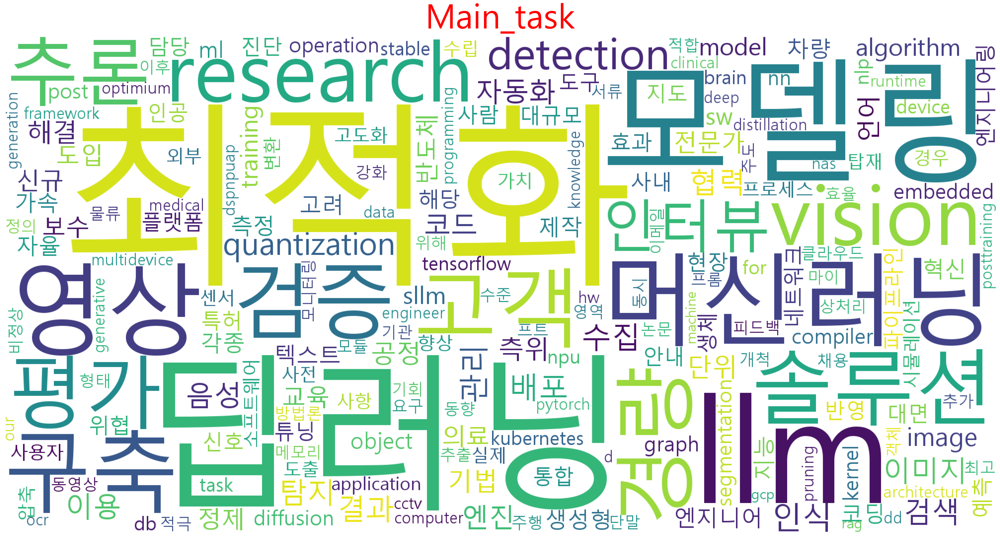

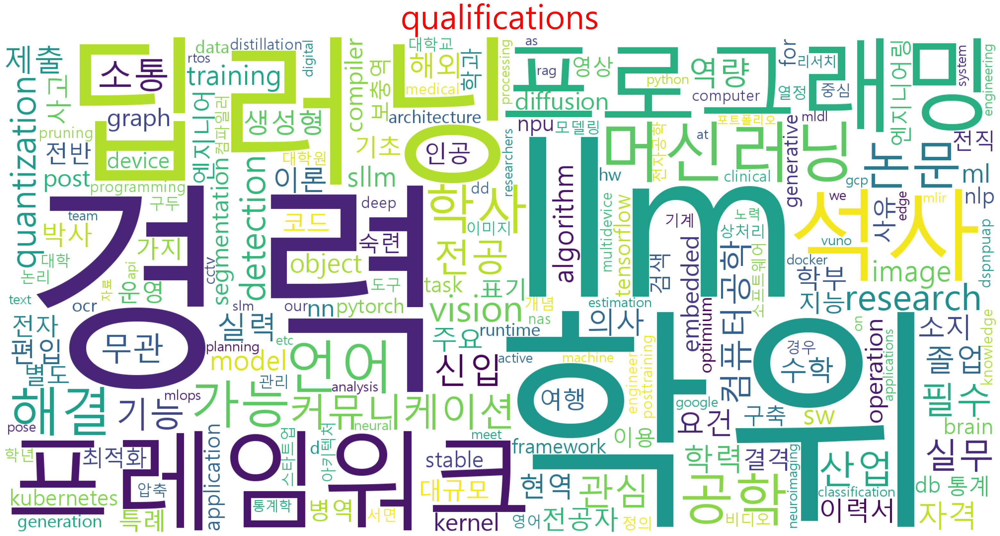

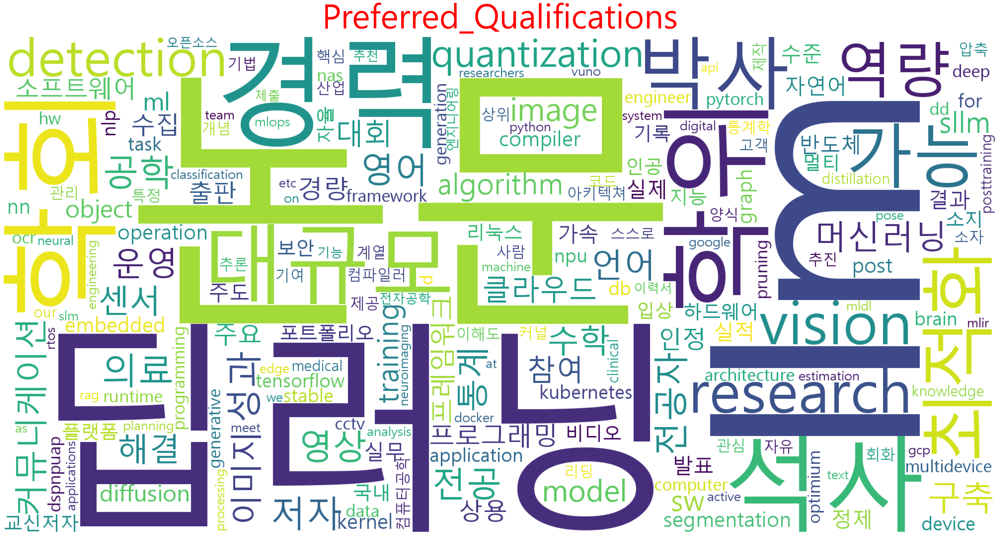

In [ ]:
# wordcloud 만들기
for i in token_rank:
    wc = WordCloud(font_path = 'C:\Windows\Fonts\malgun.ttf',background_color="white",width=2000, height=1000).generate_from_frequencies(all_token_rank[i]) 
    plt.figure(figsize = (40,40))
    plt.imshow(wc)
    plt.axis('off')
    plt.title(i,fontsize=75, color='red')
    plt.show()

## 기술 및 tool

In [139]:
skill_stop_words = ['인공 지능','딥 러닝','개발']
df['skills'].to_csv('skills.txt',encoding='utf-8-sig')
skills = open('skills.txt',encoding='utf-8-sig').read()
pattern = r"'([^']+)'"  
tokens = re.findall(pattern, skills)
tokens = [word for word in tokens if not word in skill_stop_words] #불용어 제거
tokens = Counter(tokens)  
tokens_dict = dict(tokens.most_common())
tokens_dict

{'Python': 33,
 'Pytorch': 16,
 'C++': 13,
 'Linux': 11,
 'Github': 10,
 'Git': 9,
 'C': 8,
 'AWS': 8,
 'Tensorflow': 8,
 'Docker': 8,
 'Java': 3,
 'Kubernetes': 3,
 'SQL': 3,
 'Verilog': 3,
 'C / C++': 3,
 'CCTV': 3,
 'iOS': 2,
 'MySQL': 2,
 'ML': 2,
 'Ubuntu': 2,
 'OpenCV': 2,
 'Perl': 2,
 '운영체제': 2,
 '펌웨어': 2,
 'FPGA': 2,
 'SoC': 2,
 '컴퓨터 비전': 2,
 'TCL': 2,
 'CUDA': 2,
 'ElasticSearch': 1,
 'Spark': 1,
 'Android': 1,
 'React': 1,
 'HTML': 1,
 'JavaScript': 1,
 'Kotlin': 1,
 'Swift': 1,
 '신호 처리': 1,
 'JPA': 1,
 'Spring Boot': 1,
 'Shell': 1,
 'C#': 1,
 'OpenGL': 1,
 'TypeScript': 1,
 'Scripting': 1,
 'PostgreSQL': 1,
 'FastAPI': 1,
 'MongoDB': 1,
 'GCP': 1,
 'React.js': 1,
 'NLP': 1,
 'Slack': 1,
 'Scikit-Learn': 1,
 'NumPy': 1,
 'Notion': 1,
 'Flutter': 1}

<>:1: SyntaxWarning: invalid escape sequence '\W'
<>:1: SyntaxWarning: invalid escape sequence '\W'
C:\Users\User\AppData\Local\Temp\ipykernel_24488\27211860.py:1: SyntaxWarning: invalid escape sequence '\W'
  wc = WordCloud(font_path = 'C:\Windows\Fonts\malgun.ttf',background_color="white",width=2000, height=1000).generate_from_frequencies(tokens_dict)


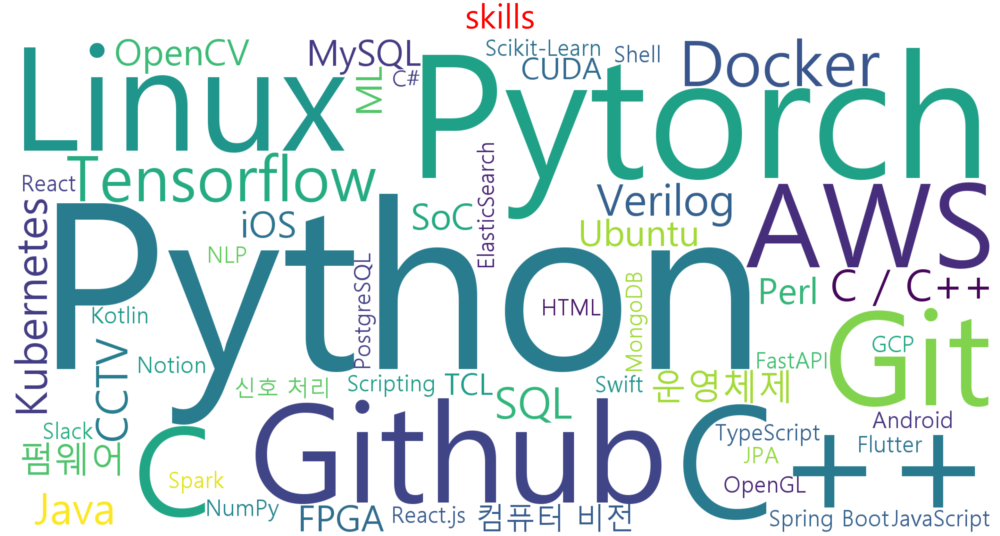

In [140]:
wc = WordCloud(font_path = 'C:\Windows\Fonts\malgun.ttf',background_color="white",width=2000, height=1000).generate_from_frequencies(tokens_dict)
plt.figure(figsize = (40,40))
plt.imshow(wc)
plt.axis('off')
plt.title('skills',fontsize=75, color='red')
plt.show()

In [141]:
tokens_df = pd.DataFrame(tokens_dict.items(), columns=['Skill', 'Count'])
tokens_df = tokens_df.sort_values(by='Count', ascending=False)
tokens_df.head()

,Skill,Count
0,Python,33
1,Pytorch,16
2,C++,13
3,Linux,11
4,Github,10


C:\Users\User\AppData\Local\Temp\ipykernel_24488\1472338351.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar = sns.barplot(data=tokens_df, x='Skill', y='Count', palette=sns.color_palette("husl", n_colors=len(tokens_df)))


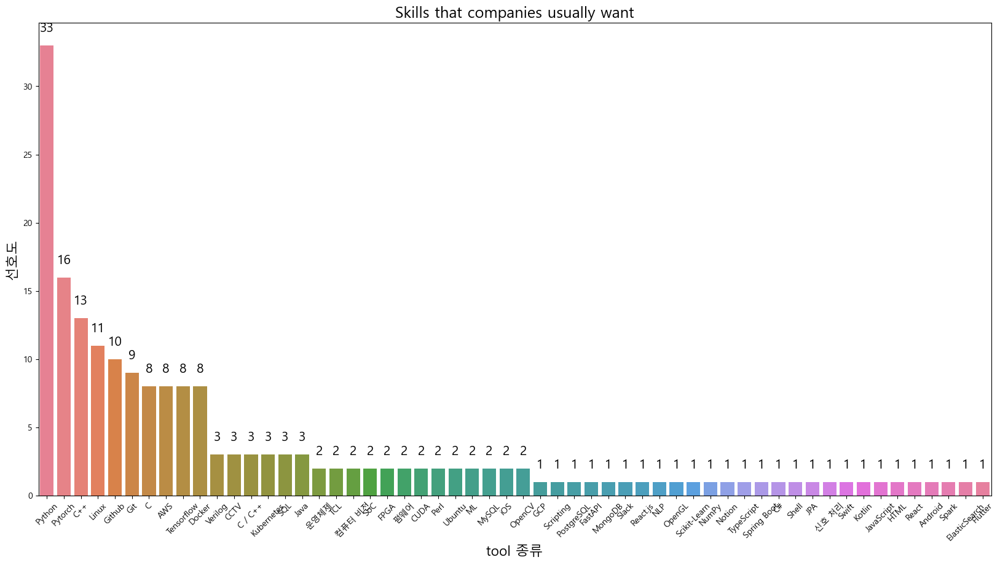

In [142]:
plt.figure(figsize=(20, 10))
bar = sns.barplot(data=tokens_df, x='Skill', y='Count', palette=sns.color_palette("husl", n_colors=len(tokens_df)))

bar.set_title('Skills that companies usually want', fontsize=18)
bar.set_xlabel('tool 종류', fontdict={'size': 16})                   
bar.set_ylabel('선호도', fontdict={'size': 16}) 
for p in bar.patches: 
    height = p.get_height()
    bar.text(p.get_x() + p.get_width() / 2., height + 1, int(height), ha='center', size=15)
plt.xticks(rotation=45)
plt.show()


## 형태소 문제

In [28]:
# 위 결과를 보면 딥러닝과 머신러닝과 같은 단어가 올바르게 추출되지 않은것을 확인할 수 있다.
import konlpy
print(konlpy.__file__)

c:\Users\User\anaconda3\envs\Job_Analysis\Lib\site-packages\konlpy\__init__.py


In [2]:
os.chdir('c:\\Users\\User\\anaconda3\\envs\\Job_Analysis\\Lib\\site-packages\\konlpy\\java')
os.getcwd() 

'c:\\Users\\User\\anaconda3\\envs\\Job_Analysis\\Lib\\site-packages\\konlpy\\java'

In [5]:
with open(f"c:\\Users\\User\\anaconda3\\envs\\Job_Analysis\\Lib\\site-packages\\konlpy\\java\\org\\\openkoreantext\\processor\\util\\noun\\names.txt") as f:
    data = f.read()
    
print(data)

가몽
가온
갓세븐
강새이
게임닉가
관우
귀여미
규
김유이
김준면
까까런
노컷
누너예
니노
다마고치
다이무스
대학생
데이브
도요토미
동운
동이
두주니
디시인사이드
디오
라몹
라스
라옵
멍구
메이든
명덕
명량
문민정부
미네
방엘리
병헌
붓다
비정상회담
빼빼로
삼풍
샤인온미
성식
성열
세라문
세라복
세종대왕
손권
손책
쇼미더머니
쇼챔
순규
스라소니
신동아
신쓰패밀리
신아라
아베
안상홍
안홍준
여누
여랑
여포
연합
오꾸닭
요섭
웃찾사
원식
유병언
유비
유이
윤기형
이나단
이명박
이완용
임창용
자괴
자니윤
자대련
자유
재중이
전교조
정윤회
제갈량
조자룡
조조
준면
지오디
지존파
진영오
차작가
차트
창섭
챠트
첸
코르사주
하무열
하용파쿠
혁재
현이
현태
혜미



<>:1: SyntaxWarning: invalid escape sequence '\o'
<>:1: SyntaxWarning: invalid escape sequence '\o'
C:\Users\User\AppData\Local\Temp\ipykernel_24248\494343299.py:1: SyntaxWarning: invalid escape sequence '\o'
  with open(f"c:\\Users\\User\\anaconda3\\envs\\Job_Analysis\\Lib\\site-packages\\konlpy\\java\\org\\\openkoreantext\\processor\\util\\noun\\names.txt") as f:


In [7]:
# 새 단어 추가
data += '딥러닝\n머신러닝\n시계열\n생성형\n'

# 사전 저장
with open("c:\\Users\\User\\anaconda3\\envs\\Job_Analysis\\Lib\\site-packages\\konlpy\\java\\org\\\openkoreantext\\processor\\util\\noun\\names.txt", 'w') as f:
    f.write(data)
    
print(data)

가몽
가온
갓세븐
강새이
게임닉가
관우
귀여미
규
김유이
김준면
까까런
노컷
누너예
니노
다마고치
다이무스
대학생
데이브
도요토미
동운
동이
두주니
디시인사이드
디오
라몹
라스
라옵
멍구
메이든
명덕
명량
문민정부
미네
방엘리
병헌
붓다
비정상회담
빼빼로
삼풍
샤인온미
성식
성열
세라문
세라복
세종대왕
손권
손책
쇼미더머니
쇼챔
순규
스라소니
신동아
신쓰패밀리
신아라
아베
안상홍
안홍준
여누
여랑
여포
연합
오꾸닭
요섭
웃찾사
원식
유병언
유비
유이
윤기형
이나단
이명박
이완용
임창용
자괴
자니윤
자대련
자유
재중이
전교조
정윤회
제갈량
조자룡
조조
준면
지오디
지존파
진영오
차작가
차트
창섭
챠트
첸
코르사주
하무열
하용파쿠
혁재
현이
현태
혜미
딥러닝
머신러닝
시계열
생성형



<>:5: SyntaxWarning: invalid escape sequence '\o'
<>:5: SyntaxWarning: invalid escape sequence '\o'
C:\Users\User\AppData\Local\Temp\ipykernel_24248\3714012465.py:5: SyntaxWarning: invalid escape sequence '\o'
  with open("c:\\Users\\User\\anaconda3\\envs\\Job_Analysis\\Lib\\site-packages\\konlpy\\java\\org\\\openkoreantext\\processor\\util\\noun\\names.txt", 'w') as f:


In [8]:
from konlpy.tag import Okt

okt = Okt()

print(okt.nouns("딥러닝 먹고 싶다."))
print(okt.pos("머신러닝 먹고 싶다."))
print(okt.pos("시계열 일을 합니다."))
print(okt.pos("생성형 정말 이뻐요."))

['딥러닝']
[('머신러닝', 'Noun'), ('먹고', 'Verb'), ('싶다', 'Verb'), ('.', 'Punctuation')]
[('시계열', 'Noun'), ('일', 'Noun'), ('을', 'Josa'), ('합니다', 'Verb'), ('.', 'Punctuation')]
[('생성형', 'Noun'), ('정말', 'Noun'), ('이뻐요', 'Adjective'), ('.', 'Punctuation')]
